In [1]:
# Importing necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import pandas as pd
import quandl
import cpi
import numpy as np
import yfinance as yf
import scipy.stats as scs
from datetime import date
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.holtwinters import ExponentialSmoothing, SimpleExpSmoothing, Holt
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
from statsmodels.stats.diagnostic import acorr_ljungbox
import pmdarima as pm

from chapter_3_utils import test_autocorrelation #in other to import this file, move the 'chapter 3 utilis file to root folder'

# Update the CPI data if needed
# cpi.update()

# Matplotlib inline settings for Jupyter notebooks
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Disable warnings
warnings.filterwarnings('ignore')

In [2]:
# Set plot style and figure properties
plt.style.use('seaborn')

# plt.style.use('seaborn-colorblind') # Alternative style
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300

# Ignore future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Time Series Modeling

## Decomposing time series

2. Download the prices of gold for years 2000-2011 and resample to monthly values:

In [3]:
# Set Quandl API key
QUANDL_KEY = 'zdnXhQuEaGjoTtwytDk-' # replace {key} with your own API key
quandl.ApiConfig.api_key = QUANDL_KEY

# Fetch the gold price data from Quandl
df = quandl.get(dataset='WGC/GOLD_MONAVG_USD',
                start_date='2000-01-01',
                end_date='2011-12-31')

# Rename the 'Value' column to 'price'
df.rename(columns={'Value': 'price'}, inplace=True)

# Resample the DataFrame to monthly frequency and take the last value of each month
df = df.resample('M').last()

# Print the shape of the DataFrame and display the first few rows
print(f'Shape of DataFrame: {df.shape}')
print(df.head())

Shape of DataFrame: (144, 1)
             price
Date              
2000-01-31  284.31
2000-02-29  299.86
2000-03-31  286.39
2000-04-30  279.69
2000-05-31  275.19


3. Add rolling mean and standard deviation:

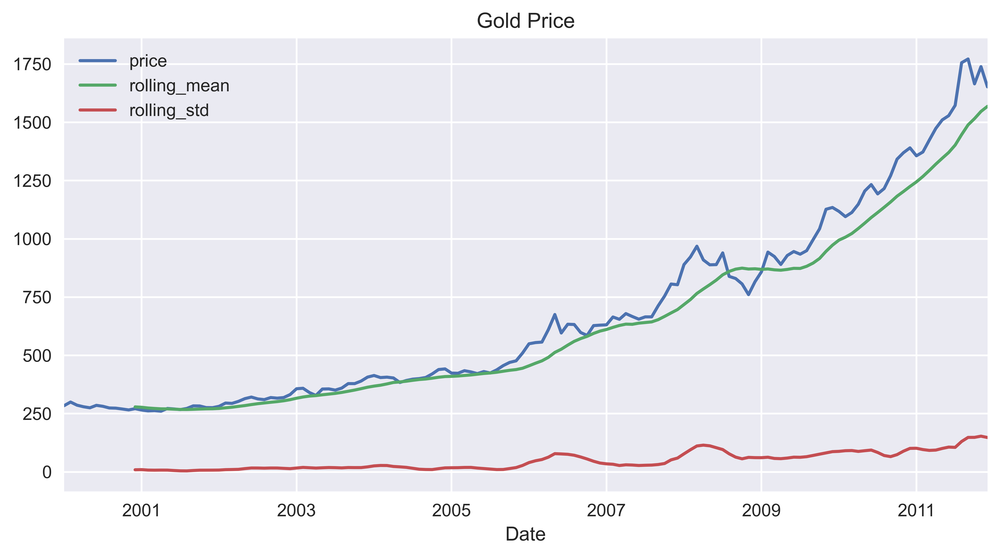

In [4]:
# Calculate rolling mean and standard deviation
WINDOW_SIZE = 12
df['rolling_mean'] = df.price.rolling(window=WINDOW_SIZE).mean()
df['rolling_std'] = df.price.rolling(window=WINDOW_SIZE).std()

# Plot the data
df.plot(title='Gold Price')

# Adjust layout and show plot
plt.tight_layout()
plt.show()

4. Carry out seasonal decomposition using the multiplicative model:

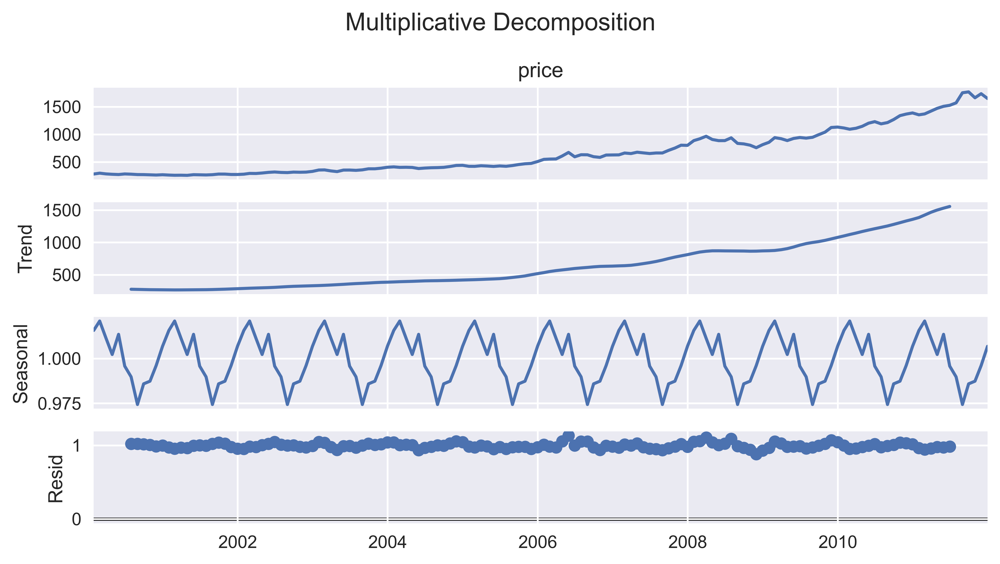

In [5]:
# Perform seasonal decomposition
decomposition_results = seasonal_decompose(df.price, model='multiplicative')

# Plot the decomposition results
decomposition_results.plot().suptitle('Multiplicative Decomposition', fontsize=14)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

## Testing for stationarity in time series

0: Download the data:

In [6]:
# Replace with your own API key
QUANDL_KEY = 'zdnXhQuEaGjoTtwytDk-' 
quandl.ApiConfig.api_key = QUANDL_KEY

try:
    # Retrieve the dataset from Quandl
    df = quandl.get(dataset='WGC/GOLD_MONAVG_USD',
                    start_date='2000-01-01', 
                    end_date='2011-12-31')

    # Ensure the expected column 'Value' is present
    if 'Value' in df.columns:
        # Rename the 'Value' column to 'price'
        df.rename(columns={'Value': 'price'}, inplace=True)
    else:
        raise ValueError("Expected column 'Value' not found in the dataset")

    # Resample the data to get the last observation of each month
    df = df.resample('M').last()

    print(df.head())  # Print the first few rows of the dataframe for verification

except Exception as e:
    print(f"An error occurred: {e}")

             price
Date              
2000-01-31  284.31
2000-02-29  299.86
2000-03-31  286.39
2000-04-30  279.69
2000-05-31  275.19


2. Define a function for running the ADF test:

In [7]:
def adf_test(x: pd.Series or np.ndarray) -> pd.DataFrame:
    '''
    Function for performing the Augmented Dickey-Fuller test for stationarity
    
    Null Hypothesis: time series is not stationary
    Alternate Hypothesis: time series is stationary
    
    Parameters
    ----------
    x : pd.Series or np.ndarray
        The time series to be checked for stationarity
    
    Returns
    -------
    results: pd.DataFrame
        A DataFrame with the ADF test's results
    '''
    
    if not isinstance(x, (pd.Series, np.ndarray)):
        raise ValueError("Input must be a pd.Series or np.ndarray")
    
    indices = ['Test Statistic', 'p-value',
               '# of Lags Used', '# of Observations Used']
    
    adf_test = adfuller(x, autolag='AIC')
    results = pd.Series(adf_test[0:4], index=indices)
    
    for key, value in adf_test[4].items():
        results[f'Critical Value ({key})'] = value
    
    return results.to_frame(name='ADF Test Results')

In [8]:
adf_test(df.price)

,ADF Test Results
Test Statistic,3.510499
p-value,1.000000
# of Lags Used,14.000000
# of Observations Used,129.000000
Critical Value (1%),-3.482088
Critical Value (5%),-2.884219
Critical Value (10%),-2.578864


3. Define a function for running the KPSS test:

In [9]:
def kpss_test(x: pd.Series or np.ndarray, h0_type: str = 'c') -> pd.DataFrame:
    '''
    Function for performing the Kwiatkowski-Phillips-Schmidt-Shin test for stationarity
    
    Null Hypothesis: time series is stationary
    Alternate Hypothesis: time series is not stationary
    
    Parameters
    ----------
    x: pd.Series or np.ndarray
        The time series to be checked for stationarity
    h0_type: str, {'c', 'ct'}
        Indicates the null hypothesis of the KPSS test:
        * 'c': The data is stationary around a constant (default)
        * 'ct': The data is stationary around a trend
        
    Returns
    -------
    results: pd.DataFrame
        A DataFrame with the KPSS test's results
    '''
    
    if not isinstance(x, (pd.Series, np.ndarray)):
        raise ValueError("Input must be a pd.Series or np.ndarray")
    if h0_type not in ['c', 'ct']:
        raise ValueError("h0_type must be 'c' or 'ct'")
    
    indices = ['Test Statistic', 'p-value', '# of Lags']
    
    kpss_test = kpss(x, regression=h0_type)
    results = pd.Series(kpss_test[0:3], index=indices)
    
    for key, value in kpss_test[3].items():
        results[f'Critical Value ({key})'] = value
    
    return results.to_frame(name='KPSS Test Results')

In [10]:
kpss_test(df.price)

,KPSS Test Results
Test Statistic,1.539929
p-value,0.010000
# of Lags,8.000000
Critical Value (10%),0.347000
Critical Value (5%),0.463000
Critical Value (2.5%),0.574000
Critical Value (1%),0.739000


4. Generate the ACF/PACF plots:

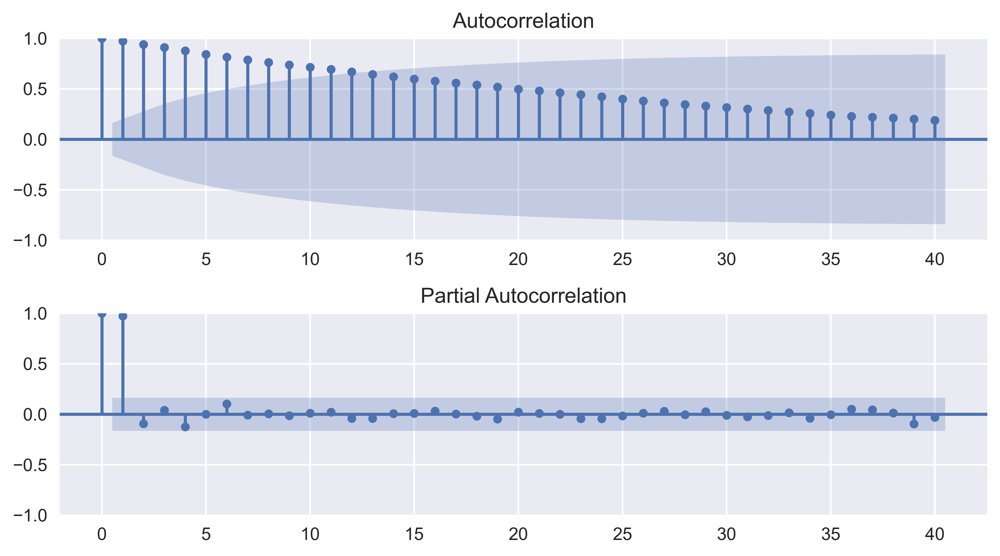

In [11]:

N_LAGS = 40
SIGNIFICANCE_LEVEL = 0.05

fig, ax = plt.subplots(2, 1)
plot_acf(df.price, ax=ax[0], lags=N_LAGS, 
        alpha=SIGNIFICANCE_LEVEL)
plot_pacf(df.price, ax=ax[1], lags=N_LAGS, 
         alpha=SIGNIFICANCE_LEVEL)

plt.tight_layout()
plt.show()

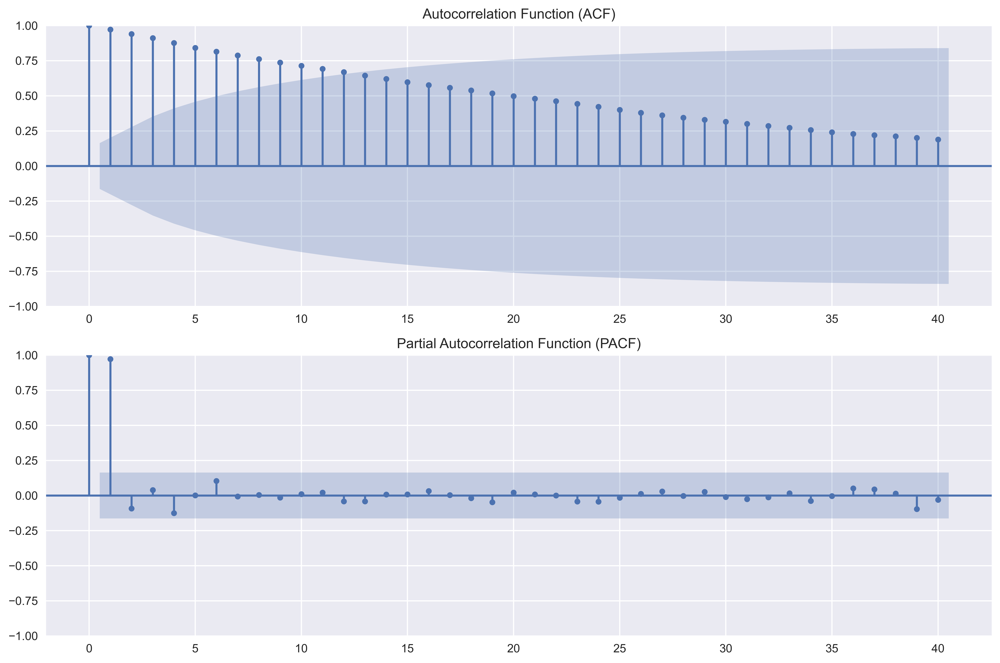

In [12]:
def plot_acf_pacf(series: pd.Series, lags: int = 40, significance_level: float = 0.05) -> None:
    '''
    Plot the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF)
    
    Parameters
    ----------
    series : pd.Series
        The time series data to plot
    lags : int, optional
        The number of lags to include in the ACF and PACF plots (default is 40)
    significance_level : float, optional
        The significance level for the confidence intervals (default is 0.05)
    '''
    fig, ax = plt.subplots(2, 1, figsize=(12, 8))
    
    plot_acf(series, ax=ax[0], lags=lags, alpha=significance_level)
    plot_pacf(series, ax=ax[1], lags=lags, alpha=significance_level)
    
    ax[0].set_title('Autocorrelation Function (ACF)')
    ax[1].set_title('Partial Autocorrelation Function (PACF)')
    
    plt.tight_layout()
    plt.show()

# Plot the viz
plot_acf_pacf(df.price, lags=N_LAGS, significance_level=SIGNIFICANCE_LEVEL)

## Correcting for stationarity in time series

0: Download the data:

In [13]:
def fetch_gold_data(api_key: str, dataset: str, start_date: str, end_date: str) -> pd.DataFrame:
    '''
    Fetches gold price data from Quandl, resamples it monthly, and renames the columns.
    
    Parameters
    ----------
    api_key : str
        Your Quandl API key.
    dataset : str
        The dataset to fetch from Quandl.
    start_date : str
        The start date for the data retrieval in 'YYYY-MM-DD' format.
    end_date : str
        The end date for the data retrieval in 'YYYY-MM-DD' format.
    
    Returns
    -------
    pd.DataFrame
        A DataFrame with the resampled and renamed data.
    '''
    try:
        # Configure API key
        quandl.ApiConfig.api_key = api_key
        
        # Fetch the dataset
        df = quandl.get(dataset=dataset, start_date=start_date, end_date=end_date)
        
        # Validate the data
        if 'Value' not in df.columns:
            raise ValueError("Expected column 'Value' not found in the dataset")
        
        # Rename the 'Value' column to 'price'
        df.rename(columns={'Value': 'price'}, inplace=True)
        
        # Resample the data to get the last observation of each month
        df = df.resample('M').last()
        
        return df
    
    except Exception as e:
        print(f"An error occurred: {e}")
        return pd.DataFrame()  # Return an empty DataFrame in case of error

# Download the data:
QUANDL_KEY = 'zdnXhQuEaGjoTtwytDk-'  # replace with your own API key
dataset = 'WGC/GOLD_MONAVG_USD'
start_date = '2000-01-01'
end_date = '2011-12-31'

df = fetch_gold_data(QUANDL_KEY, dataset, start_date, end_date)
print(f'Shape of DataFrame: {df.shape}')
df.head()

Shape of DataFrame: (144, 1)


,price
Date,
2000-01-31,284.31
2000-02-29,299.86
2000-03-31,286.39
2000-04-30,279.69
2000-05-31,275.19


2. Deflate the gold prices (to 2011-12-31 USD values) and plot the results:

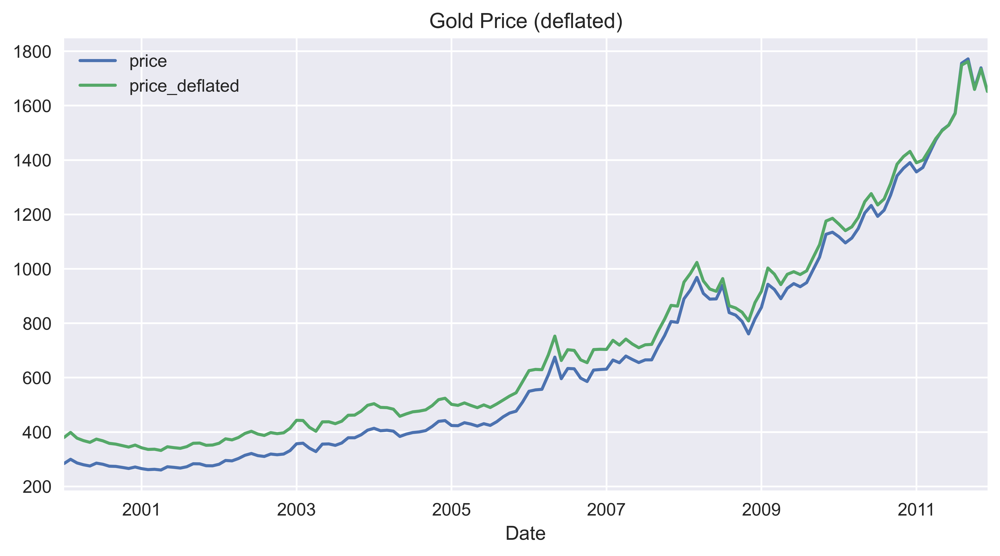

In [14]:
def deflate_prices(df: pd.DataFrame, deflation_date: date) -> pd.DataFrame:
    '''
    Deflate the prices in the DataFrame to the specified date using CPI.
    
    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the original prices.
    deflation_date : date
        The date to which prices should be deflated.
    
    Returns
    -------
    pd.DataFrame
        The DataFrame with original and deflated prices.
    '''
    if 'price' not in df.columns:
        raise ValueError("Expected column 'price' not found in the DataFrame")
    
    df['dt_index'] = df.index.to_series().apply(lambda x: x.to_pydatetime().date())
    df['price_deflated'] = df.apply(lambda x: cpi.inflate(x.price, x.dt_index, deflation_date), axis=1)
    
    return df

def plot_prices(df: pd.DataFrame, title: str = 'Gold Price (deflated)') -> None:
    '''
    Plot the original and deflated prices from the DataFrame.
    
    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the original and deflated prices.
    title : str
        The title of the plot.
    '''
    df[['price', 'price_deflated']].plot(title=title)
    plt.tight_layout()
    plt.show()

# Download the data:
DEFL_DATE = date(2011, 12, 31)

# viz the data
df = deflate_prices(df, DEFL_DATE)
plot_prices(df)

3. Deflate the series using natural logarithm and plot it together with the rolling metrics:

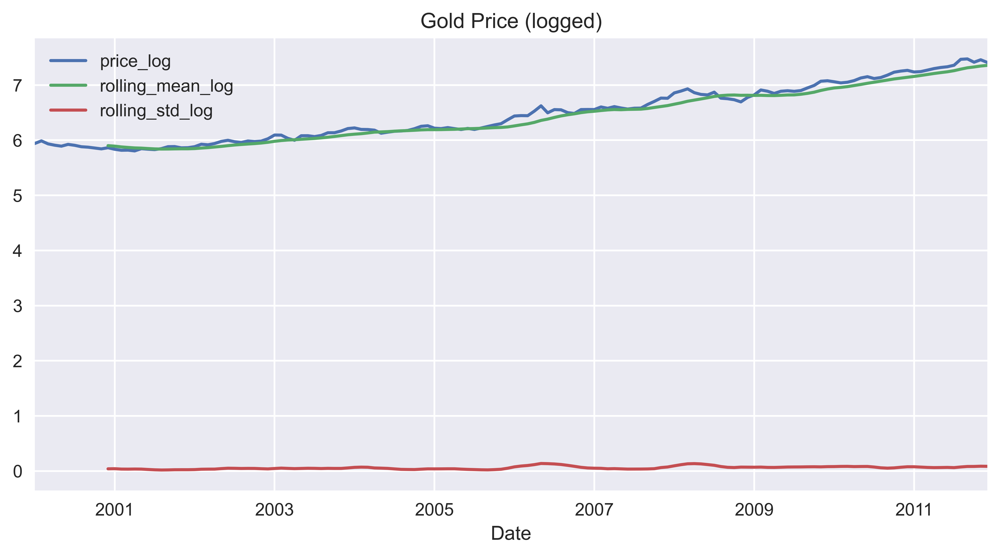

In [15]:
def calculate_log_and_rolling(df: pd.DataFrame, window: int) -> pd.DataFrame:
    '''
    Calculate the log of deflated prices, rolling mean, and rolling standard deviation.
    
    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the deflated prices.
    window : int
        The window size for calculating the rolling statistics.
    
    Returns
    -------
    pd.DataFrame
        The DataFrame with the log prices, rolling mean, and rolling standard deviation.
    '''
    if 'price_deflated' not in df.columns:
        raise ValueError("Expected column 'price_deflated' not found in the DataFrame")
    
    df['price_log'] = np.log(df.price_deflated)
    df['rolling_mean_log'] = df.price_log.rolling(window).mean()
    df['rolling_std_log'] = df.price_log.rolling(window).std()
    
    return df

def plot_selected_columns(df: pd.DataFrame, columns: list, title: str) -> None:
    '''
    Plot the selected columns from the DataFrame.
    
    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the data to plot.
    columns : list
        The list of columns to plot.
    title : str
        The title of the plot.
    '''
    df[columns].plot(title=title)
    plt.tight_layout()
    plt.show()

# Get the Data:
WINDOW = 12
selected_columns = ['price_log', 'rolling_mean_log', 'rolling_std_log']

# Viz the result
df = calculate_log_and_rolling(df, WINDOW)
plot_selected_columns(df, selected_columns, title='Gold Price (logged)')

4. Use the `test_autocorrelation` (helper function for this chapter) to investigate if the series became stationary:

ADF test statistic: 0.89 (p-val: 0.99)
KPSS test statistic: 1.66 (p-val: 0.01)


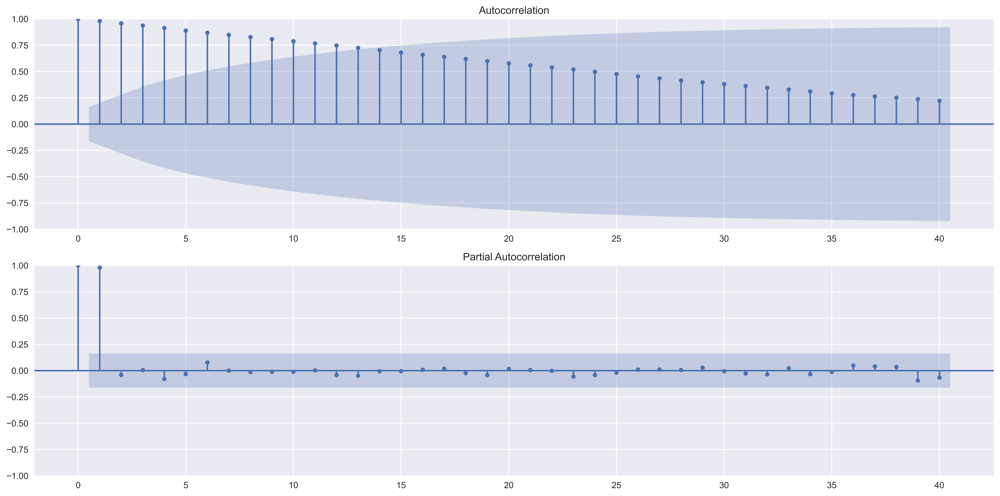

In [16]:
fig = test_autocorrelation(df.price_log)

plt.tight_layout()
plt.show()

5. Apply differencing to the series and plot the results:

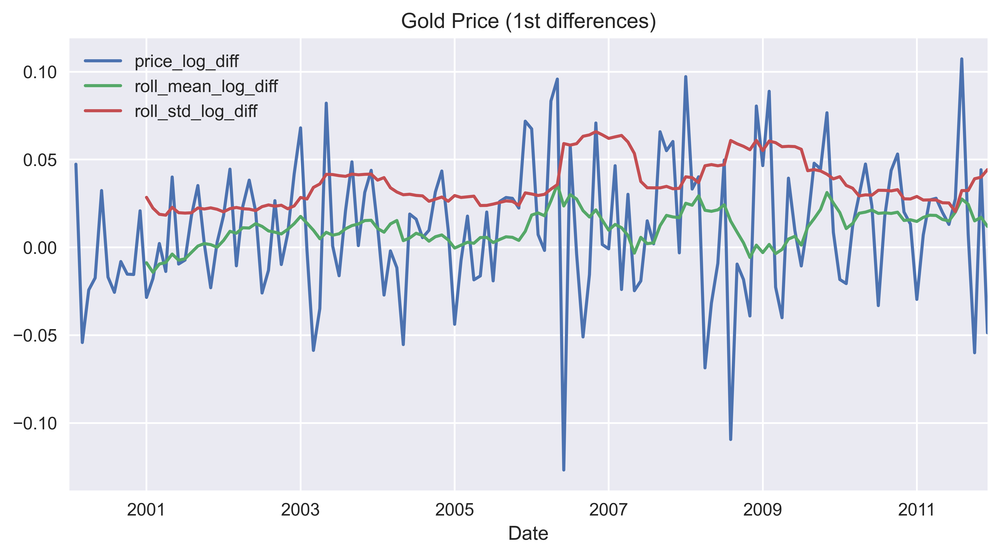

In [17]:
def calculate_first_differences(df: pd.DataFrame, window: int) -> pd.DataFrame:
    '''
    Calculate the first differences of log deflated prices, rolling mean, and rolling standard deviation.
    
    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the log deflated prices.
    window : int
        The window size for calculating the rolling statistics.
    
    Returns
    -------
    pd.DataFrame
        The DataFrame with the first differences, rolling mean, and rolling standard deviation.
    '''
    if 'price_log' not in df.columns:
        raise ValueError("Expected column 'price_log' not found in the DataFrame")
    
    df['price_log_diff'] = df.price_log.diff(1)
    df['roll_mean_log_diff'] = df.price_log_diff.rolling(window).mean()
    df['roll_std_log_diff'] = df.price_log_diff.rolling(window).std()
    
    return df

def plot_selected_columns(df: pd.DataFrame, columns: list, title: str) -> None:
    '''
    Plot the selected columns from the DataFrame.
    
    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the data to plot.
    columns : list
        The list of columns to plot.
    title : str
        The title of the plot.
    '''
    df[columns].plot(title=title)
    plt.tight_layout()
    plt.show()

# Setting the stage:
WINDOW = 12
selected_columns = ['price_log_diff', 'roll_mean_log_diff', 'roll_std_log_diff']

# Viz the result
df = calculate_first_differences(df, WINDOW)
plot_selected_columns(df, selected_columns, title='Gold Price (1st differences)')

6. Test if the series became stationary:

ADF test statistic: -9.13 (p-val: 0.00)
KPSS test statistic: 0.26 (p-val: 0.10)


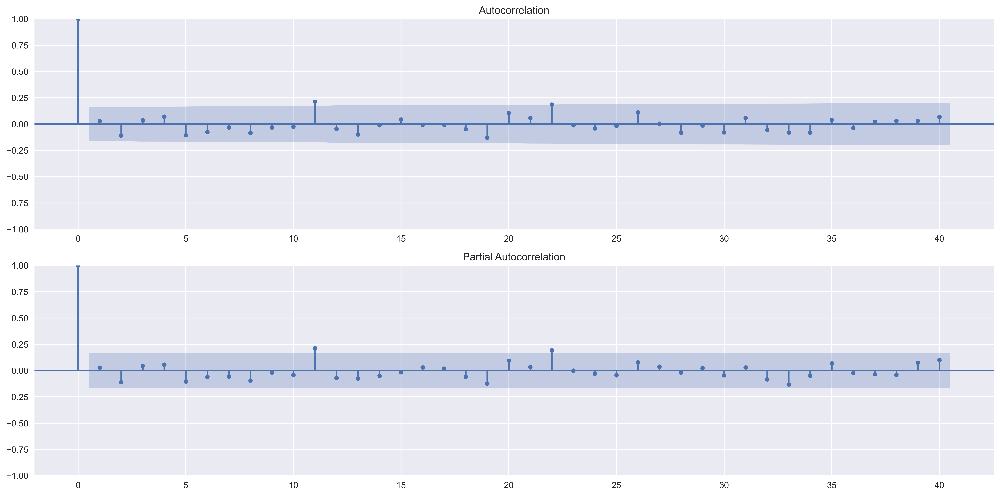

In [18]:
fig = test_autocorrelation(df.price_log_diff.dropna())

plt.tight_layout()
plt.show()

## Modeling time series with exponential smoothing methods

In [19]:
plt.set_cmap('cubehelix')
sns.set_palette('cubehelix')

COLORS = [plt.cm.cubehelix(x) for x in [0.1, 0.3, 0.5, 0.7]]

<Figure size 2400x1350 with 0 Axes>

2. Download the adjusted stock prices of Google:

In [20]:
# Download the data
df = yf.download('GOOG',
                 start='2010-01-01',
                 end='2018-12-31',
                 actions=True,
                 progress=False)

# Print the number of rows downloaded
print(f'Downloaded {df.shape[0]} rows of data.')

Downloaded 2263 rows of data.


3. Aggregate to monthly frequency:

In [21]:
goog = df.resample('M') \
         .last() \
         .rename(columns={'Adj Close': 'adj_close'}) \
         .adj_close 

4. Create the training/test split:

In [22]:
train_indices = goog.index.year < 2018
goog_train = goog[train_indices]
goog_test = goog[~train_indices]

test_length = len(goog_test)

5. Plot the prices:

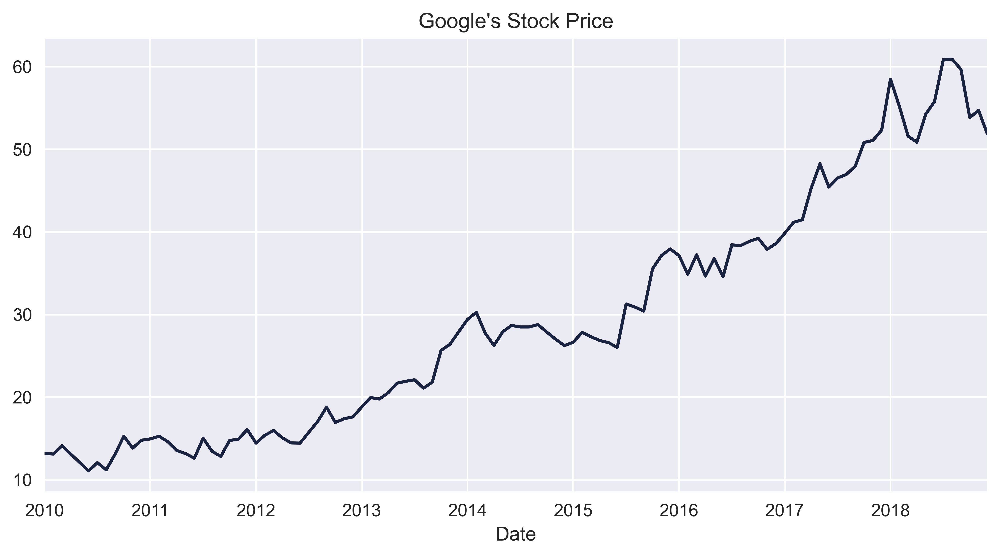

In [23]:
goog.plot(title="Google's Stock Price")

plt.tight_layout()
plt.show()

6. Fit 3 Simple Exponential Smoothing models and create forecasts:

In [24]:
ses_1 = SimpleExpSmoothing(goog_train).fit(smoothing_level=0.2)
ses_forecast_1 = ses_1.forecast(test_length)

ses_2 = SimpleExpSmoothing(goog_train).fit(smoothing_level=0.5)
ses_forecast_2 = ses_2.forecast(test_length)

ses_3 = SimpleExpSmoothing(goog_train).fit()
alpha = ses_3.model.params['smoothing_level']
ses_forecast_3 = ses_3.forecast(test_length)

7. Plot the original prices together with the models' results:

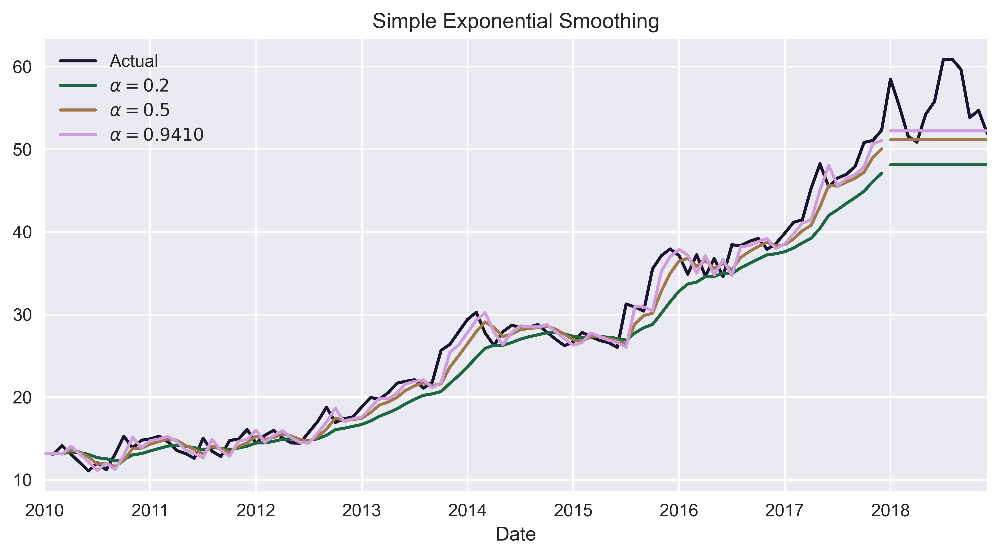

In [25]:
goog.plot(color=COLORS[0], 
         title='Simple Exponential Smoothing',
         label='Actual',
         legend=True)

ses_forecast_1.plot(color=COLORS[1], legend=True, 
                   label=r'$\alpha=0.2$')
ses_1.fittedvalues.plot(color=COLORS[1])

ses_forecast_2.plot(color=COLORS[2], legend=True, 
                   label=r'$\alpha=0.5$')
ses_2.fittedvalues.plot(color=COLORS[2])

ses_forecast_3.plot(color=COLORS[3], legend=True, 
                   label=r'$\alpha={0:.4f}$'.format(alpha))
ses_3.fittedvalues.plot(color=COLORS[3])

plt.tight_layout()
plt.show()

8. Fit 3 variants of the Holt's Smoothing models and create forecasts:

In [26]:
# Holt's model with linear trend
hs_1 = Holt(goog_train).fit()
hs_forecast_1 = hs_1.forecast(test_length)

# Holt's model with exponential trend
hs_2 = Holt(goog_train, exponential=True).fit()
# equivalent to ExponentialSmoothing(goog_train, trend='mul').fit()
hs_forecast_2 = hs_2.forecast(test_length)

# Holt's model with exponential trend and damping
hs_3 = Holt(goog_train, exponential=False, 
           damped=True).fit(damping_slope=0.99)
hs_forecast_3 = hs_3.forecast(test_length)

9. Plot the original prices together with the models' results:

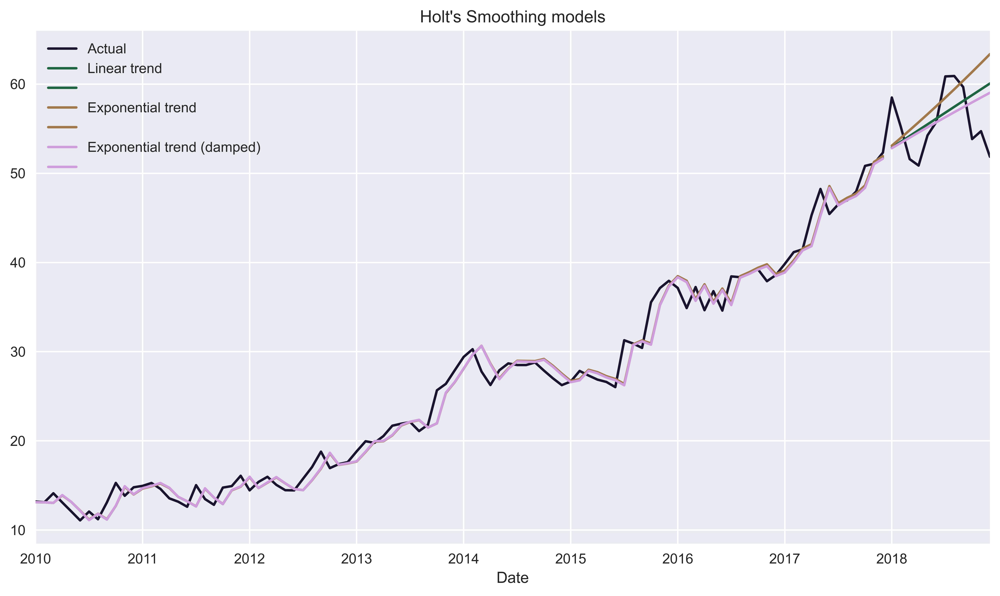

In [27]:
def plot_holts_models(actual: pd.Series, fitted1: pd.Series, forecast1: pd.Series,
                      fitted2: pd.Series, forecast2: pd.Series,
                      fitted3: pd.Series, forecast3: pd.Series,
                      colors: list, title: str) -> None:
    '''
    Plot the actual data and the fitted values/forecasts of three different Holt's Smoothing models.
    
    Parameters
    ----------
    actual : pd.Series
        The actual data series.
    fitted1 : pd.Series
        The fitted values of the first model.
    forecast1 : pd.Series
        The forecast values of the first model.
    fitted2 : pd.Series
        The fitted values of the second model.
    forecast2 : pd.Series
        The forecast values of the second model.
    fitted3 : pd.Series
        The fitted values of the third model.
    forecast3 : pd.Series
        The forecast values of the third model.
    colors : list
        A list of colors for plotting.
    title : str
        The title of the plot.
    '''
    plt.figure(figsize=(10, 6))

    actual.plot(color=colors[0], title=title, label='Actual', legend=True)
    
    fitted1.plot(color=colors[1], label='Linear trend', legend=True)
    forecast1.plot(color=colors[1], legend=True)
    
    fitted2.plot(color=colors[2], label='Exponential trend', legend=True)
    forecast2.plot(color=colors[2], legend=True)
    
    fitted3.plot(color=colors[3], label='Exponential trend (damped)', legend=True)
    forecast3.plot(color=colors[3], legend=True)
    
    plt.tight_layout()
    plt.show()

# Viz the data:
plot_holts_models(actual=goog,
                  fitted1=hs_1.fittedvalues, forecast1=hs_forecast_1,
                  fitted2=hs_2.fittedvalues, forecast2=hs_forecast_2,
                  fitted3=hs_3.fittedvalues, forecast3=hs_forecast_3,
                  colors=COLORS,
                  title="Holt's Smoothing models")

## Modeling time series with ARIMA class models

2. Download Google's stock prices and resample to weekly frequency:

In [28]:
df = yf.download('GOOG',
                start='2015-01-01',
                end='2018-12-31',
                progress=False)

goog = df.resample('W') \
         .last() \
         .rename(columns={'Adj Close': 'adj_close'}) \
         .adj_close

3. Apply the first differences to the price series and plot them together:

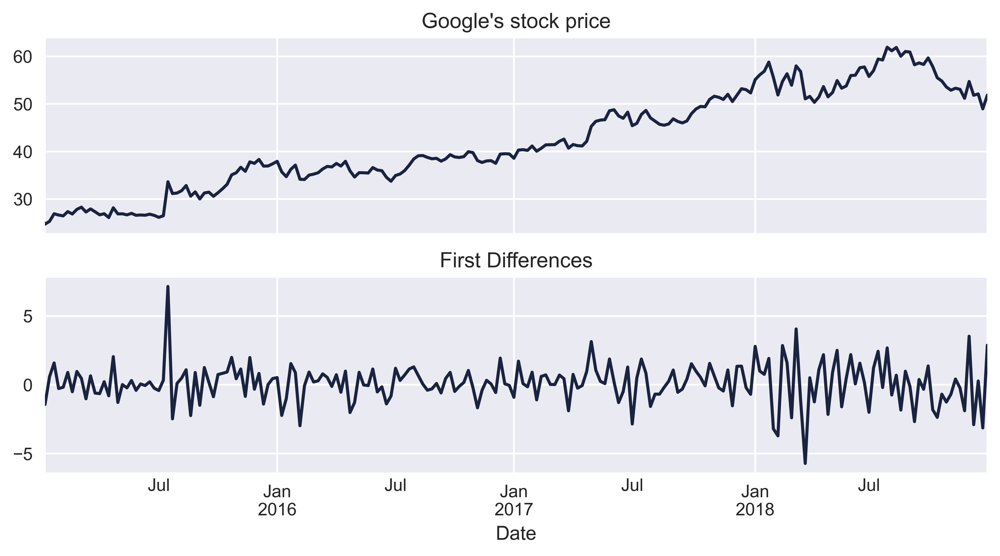

In [29]:
goog_diff = goog.diff().dropna()

fig, ax = plt.subplots(2, sharex=True)
goog.plot(title = "Google's stock price", ax=ax[0])
goog_diff.plot(ax=ax[1], title='First Differences')

plt.tight_layout()
plt.show()

4. Test the differenced series for stationarity:

ADF test statistic: -12.79 (p-val: 0.00)
KPSS test statistic: 0.08 (p-val: 0.10)


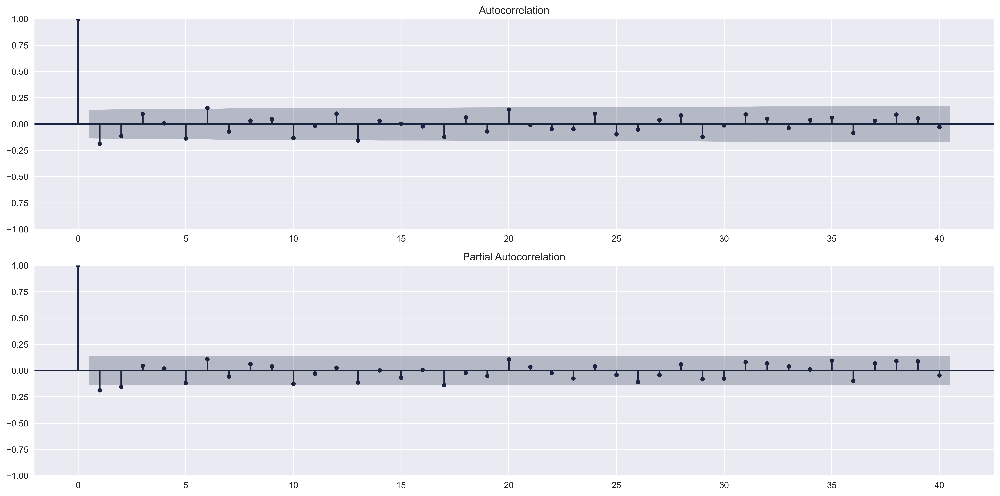

In [30]:
fig = test_autocorrelation(goog_diff)

plt.tight_layout()
plt.show()

5. Based on the results of the tests, specify the ARIMA model and fit it to the data:

In [31]:
# Use adjusted close prices
goog = goog.rename('price')

# Fit the ARIMA model
arima = ARIMA(goog, order=(2, 1, 1)).fit()

# Print the summary of the ARIMA model
print(arima.summary())

                               SARIMAX Results                                
Dep. Variable:                  price   No. Observations:                  209
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -365.554
Date:                Thu, 06 Jun 2024   AIC                            739.108
Time:                        15:22:32   BIC                            752.458
Sample:                    01-04-2015   HQIC                           744.506
                         - 12-30-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4062      0.397     -1.024      0.306      -1.184       0.371
ar.L2         -0.1833      0.082     -2.241      0.025      -0.344      -0.023
ma.L1          0.2051      0.405      0.507      0.6

In [32]:
def arima_diagnostics(resids: np.ndarray, n_lags: int = 40) -> plt.Figure:
    '''
    Function for diagnosing the fit of an ARIMA model by investigating the residuals.
    
    Parameters
    ----------
    resids : np.ndarray
        An array containing the residuals of a fitted model
    n_lags : int
        Number of lags for autocorrelation plot
    
    Returns
    -------
    fig : matplotlib.figure.Figure
        Created figure
    '''
    
    # Create placeholder subplots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))
    
    r = resids
    resids = (r - np.nanmean(r)) / np.nanstd(r)  # Standardize residuals
    resids_nonmissing = resids[~np.isnan(resids)]
    
    # Residuals over time
    sns.lineplot(x=np.arange(len(resids)), y=resids, ax=ax1)
    ax1.set_title('Standardized residuals')
    
    # Distribution of residuals
    x_lim = (-1.96 * 2, 1.96 * 2)
    r_range = np.linspace(x_lim[0], x_lim[1])
    norm_pdf = scs.norm.pdf(r_range)
    
    sns.histplot(resids_nonmissing, kde=True, stat='density', ax=ax2)
    ax2.plot(r_range, norm_pdf, 'g', lw=2, label='N(0,1)')
    ax2.set_title('Distribution of standardized residuals')
    ax2.set_xlim(x_lim)
    ax2.legend()
    
    # Q-Q plot
    sm.qqplot(resids_nonmissing, line='s', ax=ax3)
    ax3.set_title('Q-Q plot')
    
    # ACF plot
    plot_acf(resids, ax=ax4, lags=n_lags, alpha=0.05)
    ax4.set_title('ACF plot')
    
    plt.tight_layout()
    
    return fig

7. Test the residuals of the fitted ARIMA model:

In [33]:
arima_diagnostics(arima.resid, 40)

plt.tight_layout()
plt.show()

8. Apply the Ljung-Box's test for no autocorrelation in the residuals and plot the results:

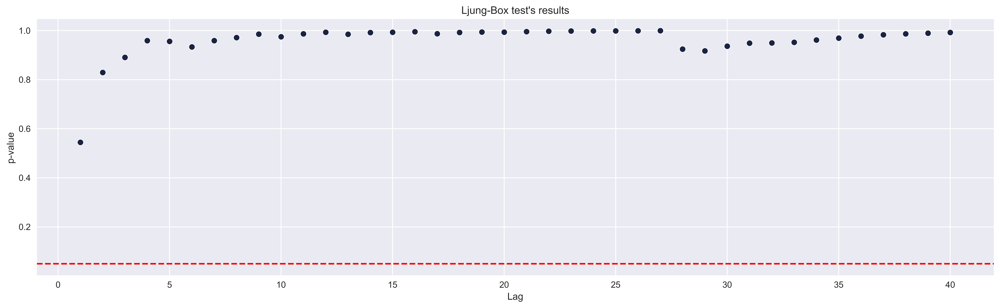

In [34]:
def plot_ljung_box_test(residuals: np.ndarray, lags: int = 40) -> None:
    '''
    Plot the results of the Ljung-Box test for autocorrelation in residuals.
    
    Parameters
    ----------
    residuals : np.ndarray
        The residuals of a fitted model.
    lags : int, optional
        The number of lags to include in the Ljung-Box test (default is 40).
    '''
    ljung_box_results = acorr_ljungbox(arima.resid, lags=lags)
    
    fig, ax = plt.subplots(1, figsize=[16, 5])
    sns.scatterplot(x=range(1, len(ljung_box_results) + 1), 
                    y=ljung_box_results.iloc[:, 1],  # Access the second column using .iloc[]
                    ax=ax)
    ax.axhline(0.05, ls='--', c='r')
    ax.set(title="Ljung-Box test's results",
           xlabel='Lag',
           ylabel='p-value')
    
    plt.tight_layout()
    plt.show()

# Viz the result
plot_ljung_box_test(arima.resid)

### There's more

2. We run `auto_arima` with the majority of settings set to default values. We only exclude potential seasonality.

In [35]:
auto_arima = pm.auto_arima(goog, 
                          error_action='ignore',
                          suppress_warnings=True,
                          seasonal=False)
auto_arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  209
Model:               SARIMAX(0, 1, 1)   Log Likelihood                -365.637
Date:                Thu, 06 Jun 2024   AIC                            737.273
Time:                        15:22:46   BIC                            747.286
Sample:                    01-04-2015   HQIC                           741.322
                         - 12-30-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1228      0.075      1.648      0.099      -0.023       0.269
ma.L1         -0.2376      0.070     -3.417      0.001      -0.374      -0.101
sigma2         1.9691      0.113     17.487      0.000       1.748       2.190
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):               130.88
Prob(Q):                              0.81   Prob(JB):                         0.00
Heteroskedasticity (H):               1.90   Skew:                             0.06
Prob(H) (two-sided):                  0.01   Kurtosis:                         6.88
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

3. In the next step we try to tune the search of the optimal parameters:

In [36]:
auto_arima = pm.auto_arima(goog,
                          error_action='ignore',
                          suppress_warnings=True,
                          seasonal=False,
                          stepwise=False,
                          approximation=False,
                          n_jobs=-1)
auto_arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  209
Model:               SARIMAX(3, 1, 2)   Log Likelihood                -359.586
Date:                Thu, 06 Jun 2024   AIC                            733.173
Time:                        15:23:00   BIC                            756.535
Sample:                    01-04-2015   HQIC                           742.619
                         - 12-30-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.4976      0.313      1.592      0.111      -0.115       1.110
ar.L1         -1.5445      0.138    -11.208      0.000      -1.815      -1.274
ar.L2         -1.1844      0.137     -8.622      0.000      -1.454      -0.915
ar.L3         -0.3043      0.068     -4.503      0.000      -0.437      -0.172
ma.L1          1.3586      0.140      9.725      0.000       1.085       1.632
ma.L2          0.7929      0.131      6.048      0.000       0.536       1.050
sigma2         1.8544      0.126     14.728      0.000       1.608       2.101
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               117.24
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):               1.82   Skew:                             0.09
Prob(H) (two-sided):                  0.01   Kurtosis:                         6.67
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Forecasting using ARIMA class models

1. Download additional test data and resample to weekly:

In [37]:
df = yf.download('GOOG',
                start='2019-01-01',
                end='2019-03-31',
                progress=False)

print(f'Downloaded {df.shape[0]} rows of data.')

test = df.resample('W') \
         .last() \
         .rename(columns={'Adj Close': 'adj_close'}) \
         .adj_close

Downloaded 61 rows of data.


2. Obtain forecasts from the first model and store them in a DataFrame:

In [38]:
n_forecasts = len(test)

# Forecast using ARIMA model
arima_pred = arima.forecast(steps=n_forecasts)
stderr = arima.forecast(steps=n_forecasts)
conf_int = arima.forecast(steps=n_forecasts)

# Create DataFrame for predictions and confidence intervals
arima_pred_df = pd.DataFrame({
    'prediction': arima_pred,
    'ci_lower': conf_int,
    'ci_upper': conf_int
}, index=test.index)

3. Obtain forecasts from the second model and store them in a DataFrame:

In [39]:
n_forecasts = len(test) * 2  # Double the number of forecasts

# Predict using auto_arima model
auto_arima_pred, conf_int = auto_arima.predict(n_periods=n_forecasts, 
                                               return_conf_int=True, 
                                               alpha=0.05)

# Create DataFrame for predictions and confidence intervals
auto_arima_pred_df = pd.DataFrame({
    'prediction': auto_arima_pred[:len(test)],  # Use only the first half of predictions
    'ci_lower': conf_int[:len(test), 0],  # Use only the first half of lower bounds
    'ci_upper': conf_int[:len(test), 1]   # Use only the first half of upper bounds
}, index=test.index)

4. Plot the results:

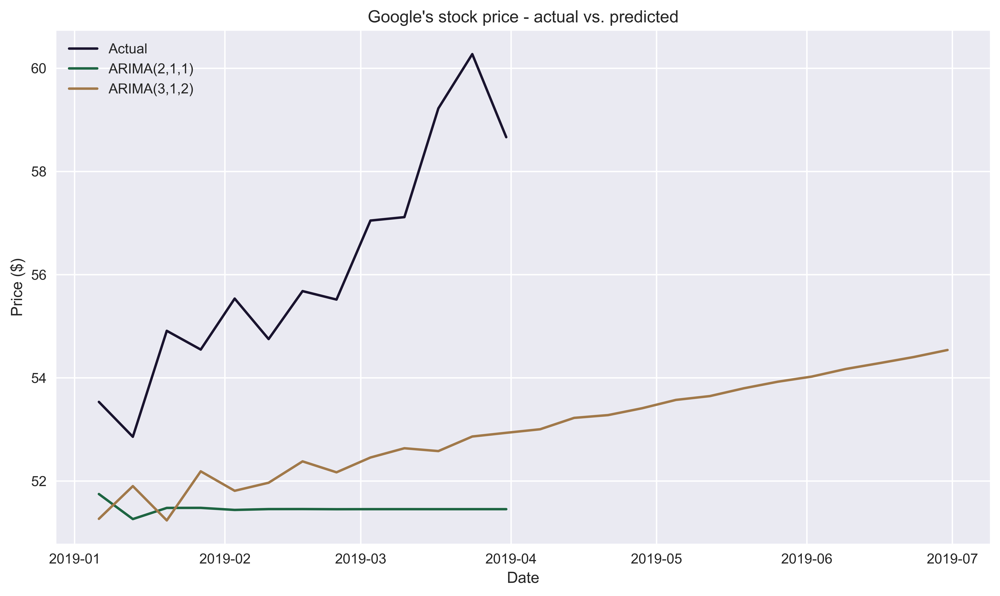

In [40]:
def plot_stock_predictions(actual: pd.Series, arima_pred: pd.Series, auto_arima_pred: pd.Series, colors: list, title: str) -> None:
    '''
    Plot the actual stock prices and the predicted values from ARIMA models.
    
    Parameters
    ----------
    actual : pd.Series
        The actual stock prices.
    arima_pred : pd.Series
        The predicted values from the first ARIMA model.
    auto_arima_pred : pd.Series
        The predicted values from the second ARIMA model.
    colors : list
        A list of colors for plotting.
    title : str
        The title of the plot.
    '''
    fig, ax = plt.subplots(1, figsize=(10, 6))

    sns.lineplot(data=actual, color=colors[0], label='Actual', ax=ax)

    ax.plot(arima_pred.index, arima_pred.values, color=colors[1], label='ARIMA(2,1,1)')
    ax.plot(auto_arima_pred.index, auto_arima_pred.values, color=colors[2], label='ARIMA(3,1,2)')

    ax.set(title=title, xlabel='Date', ylabel='Price ($)')
    ax.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

# Viz the result:
plot_stock_predictions(actual=test,
                       arima_pred=arima_pred,
                       auto_arima_pred=auto_arima_pred,
                       colors=COLORS,
                       title="Google's stock price - actual vs. predicted")